***

<font size="4">
<center>

*K-Means Analysis (Wines)*

</font>
</center>

***

<font size="3">

<br>**Problem statement:**
<br>You have a dataset containing the results of a chemical analysis of wines grown in the same region in Italy but derived from different cultivars. The analysis determined the quantities of 13 constituents found in each of the three types of wines. Analyze the dataset prform the following steps in your downstream analysis:
* Select the right number of dimensions
* Cluster the dataset
* Plot the clusters on a 2D scatter plot
* Review the cluster size (k) using Elbow plots & Silhouette diagrams
* Compare your clusters vs the different wine cultivars

</font>


*Import required modules*

In [39]:
import pandas as pd                               #Load datasets
from sklearn.preprocessing import StandardScaler  #Standardization
from sklearn.decomposition import PCA             #PCA function
from sklearn.cluster import KMeans                #K-means function
from sklearn.metrics import silhouette_score      #Silhouette score
import matplotlib.pyplot as plt                   #Plot outputs

*Data import & cleansing*

In [40]:
#Load CSV file
Wine_df_input = pd.read_csv("wine.csv",header=0)

#Exclude Wine Class from data input
Wine_df = Wine_df_input.iloc[:, 1:]

Wine_df.head(10)

,Alcohol,MalicAcid,Ash,Alcalinity,Magnesium,TotalPhenols,Flavanoids,Nonflavanoids,Proanthocyanins,ColorIntensity,Hue,OD280/OD315,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
5,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450
6,14.39,1.87,2.45,14.6,96,2.50,2.52,0.30,1.98,5.25,1.02,3.58,1290
7,14.06,2.15,2.61,17.6,121,2.60,2.51,0.31,1.25,5.05,1.06,3.58,1295
8,14.83,1.64,2.17,14.0,97,2.80,2.98,0.29,1.98,5.20,1.08,2.85,1045
9,13.86,1.35,2.27,16.0,98,2.98,3.15,0.22,1.85,7.22,1.01,3.55,1045


*Run PCA Algorithm to get around 80% variance explained*

In [41]:
# Reduce dimension using PCA

#Standardize dataframe
Wine_df = StandardScaler().fit_transform(Wine_df)

#Run the PCA algorithm
pca = PCA(n_components=4)

principalComponents = pca.fit_transform(Wine_df)
Wine_df = pd.DataFrame(data = principalComponents,
                            columns = ['PC1', 'PC2', 'PC3', 'PC4'])

#Total variance % emplained by components
#print("% variance explained by PC1 + PC2:", round(((pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])/ 1)*100,2))
print("% variance explained by PC1 + PC2 + PC3 + PC4:", round(((pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1] + pca.explained_variance_ratio_[2] + pca.explained_variance_ratio_[3])/ 1)*100,2))

% variance explained by PC1 + PC2 + PC3 + PC4: 73.6


*Run k means algorithm*

In [42]:
kmeans = KMeans(6)
y_pred = kmeans.fit_predict(Wine_df)

# Display the cluster centroids
kmeans.cluster_centers_

array([[-0.16297542,  2.01864901,  0.01184907,  0.28637268],
       [-2.46835927, -0.04722787, -0.50762037, -0.59913721],
       [ 2.66985786, -1.39150965, -0.14803966, -0.1185693 ],
       [ 1.71458862,  0.25490147, -0.46323741, -0.03554231],
       [-2.783435  , -1.86023663, -0.02814166,  0.43887441],
       [ 0.36085484,  0.54157925,  2.67346468, -0.31830387]])

In [43]:
Wine_df

,PC1,PC2,PC3,PC4
0,3.316751,-1.443463,-0.165739,-0.215631
1,2.209465,0.333393,-2.026457,-0.291358
2,2.516740,-1.031151,0.982819,0.724902
3,3.757066,-2.756372,-0.176192,0.567983
4,1.008908,-0.869831,2.026688,-0.409766
...,...,...,...,...
173,-3.370524,-2.216289,-0.342570,1.058527
174,-2.601956,-1.757229,0.207581,0.349496
175,-2.677839,-2.760899,-0.940942,0.312035
176,-2.387017,-2.297347,-0.550696,-0.688285


*Plot the clusters along the N principal components*

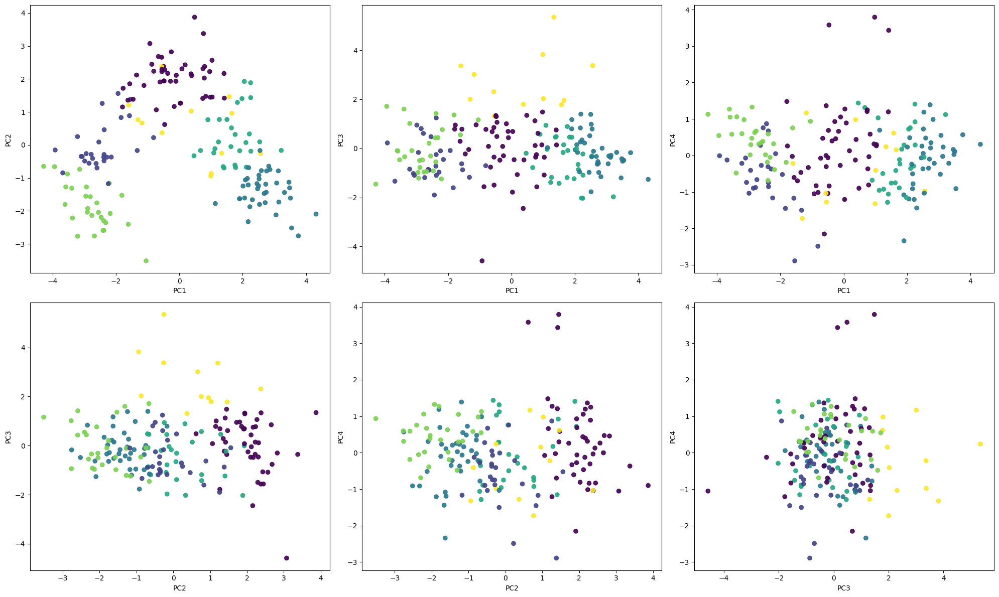

In [44]:
# Plot the clusters

fig, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2,3, figsize=(20,12))
 

#PC1 vs PC2
ax1.scatter(Wine_df['PC1'], Wine_df['PC2'], c = y_pred, alpha = 0.90)
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')


#PC1 vs PC3
ax2.scatter(Wine_df['PC1'], Wine_df['PC3'], c = y_pred, alpha = 0.90)
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC3')

#PC1 vs PC4
ax3.scatter(Wine_df['PC1'], Wine_df['PC4'], c = y_pred, alpha = 0.90)
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC4')

#PC2 vs PC3
ax4.scatter(Wine_df['PC2'], Wine_df['PC3'], c = y_pred, alpha = 0.90)
ax4.set_xlabel('PC2')
ax4.set_ylabel('PC3')

#PC2 vs PC4
ax5.scatter(Wine_df['PC2'], Wine_df['PC4'], c = y_pred, alpha = 0.90)
ax5.set_xlabel('PC2')
ax5.set_ylabel('PC4')

#PC3 vs PC4
ax6.scatter(Wine_df['PC3'], Wine_df['PC4'], c = y_pred, alpha = 0.90)
ax6.set_xlabel('PC3')
ax6.set_ylabel('PC4')

#ax.grid(True)
fig.tight_layout()

plt.show()

*Elbow Plot and Silhouette analysis*

In [45]:
distortions = []
silhouette_avg = []
K = range(2,10)

for k in K:
    kmeans = KMeans(n_clusters=k , n_init=10)
    kmeans.fit(Wine_df)
    distortions.append(kmeans.inertia_)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg.append(silhouette_score(Wine_df, cluster_labels))

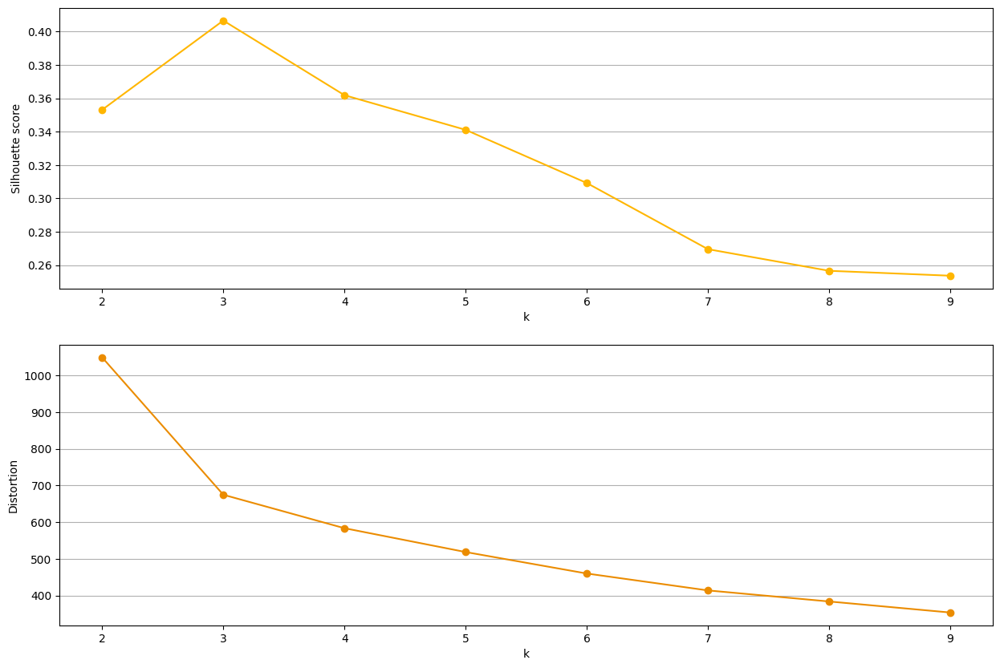

In [46]:
fig, ax = plt.subplots(2, figsize = (15,10))

ax[0].plot(K, silhouette_avg,'#FFB600', marker = 'o')
ax[0].set_xlabel('k') 
ax[0].set_ylabel('Silhouette score') 
ax[0].grid(axis='y')


ax[1].plot(K, distortions, '#EB8C00', marker = 'o')
ax[1].set_xlabel('k')
ax[1].set_ylabel('Distortion')
ax[1].grid(axis='y')


plt.show()

*Optimize K and rerun algorithm*

In [47]:
kmeans = KMeans(3)
y_pred = kmeans.fit_predict(Wine_df)

# Display the cluster centroids
kmeans.cluster_centers_

array([[ 2.25560713, -0.83354578, -0.0393534 , -0.14704466],
       [-2.72003575, -1.12565126, -0.23909324,  0.06245694],
       [-0.12730065,  1.79981758,  0.23793107,  0.10278385]])

In [48]:
Wine_df['cluster'] = y_pred
Wine_df

,PC1,PC2,PC3,PC4,cluster
0,3.316751,-1.443463,-0.165739,-0.215631,0
1,2.209465,0.333393,-2.026457,-0.291358,0
2,2.516740,-1.031151,0.982819,0.724902,0
3,3.757066,-2.756372,-0.176192,0.567983,0
4,1.008908,-0.869831,2.026688,-0.409766,0
...,...,...,...,...,...
173,-3.370524,-2.216289,-0.342570,1.058527,1
174,-2.601956,-1.757229,0.207581,0.349496,1
175,-2.677839,-2.760899,-0.940942,0.312035,1
176,-2.387017,-2.297347,-0.550696,-0.688285,1


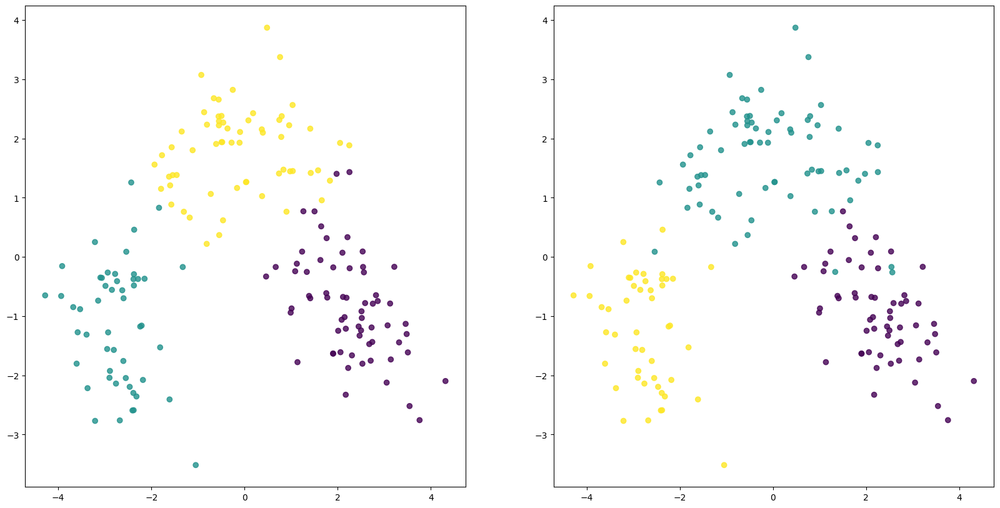

In [49]:
fig, ((ax1,ax2)) = plt.subplots(1,2, figsize=(20,10))

# Plot based on predicted clusters for features PC1 to PC4
ax1.scatter(Wine_df['PC1'], Wine_df['PC2'], c = y_pred, alpha= .80)


# Join to input dataframe
Wine_df = Wine_df.merge(Wine_df_input, 'inner', on = Wine_df.index)

# Plot PC1 vs PC2 on input wine class
ax2.scatter(Wine_df['PC1'], Wine_df['PC2'], c = Wine_df['Class'], alpha= 0.80)

# Compare predicted clusters vs input wine class
plt.show()



In [50]:
Wine_df.columns

Index(['key_0', 'PC1', 'PC2', 'PC3', 'PC4', 'cluster', 'Class', 'Alcohol',
       'MalicAcid', 'Ash', 'Alcalinity', 'Magnesium', 'TotalPhenols',
       'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'ColorIntensity',
       'Hue', 'OD280/OD315', 'Proline'],
      dtype='object')

In [51]:
import seaborn as sns

Wine_df_updated = Wine_df[['PC1', 'PC2', 'Alcohol', 'MalicAcid', 'Ash', 'Alcalinity', 'Magnesium', 'TotalPhenols', 'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'ColorIntensity', 'Hue',
       'OD280/OD315', 'Proline','cluster']]
g = sns.PairGrid(Wine_df_updated, hue='cluster', height= 8)  # Create a PairGrid object with your DataFrame
g.map_diag(sns.histplot)  # Create histograms on the diagonal
g.map_offdiag(sns.scatterplot)  # Create scatter plots for off-diagonal elements
plt.show()